# Поиск изображений по текстовому описанию

## Описание проекта
Проект для фотохостинга **«Со Смыслом» (With Sense)**. Цель — создать PoC поиска изображений по текстовому запросу. Пользователь вводит описание сцены, сервис возвращает релевантные фотографии.  

**Пример:**  
Запрос: `A man is crossing a mountain pass on a metal bridge.`  
Результат: подходящие изображения.

---

## Юридические ограничения
Сервис блокирует контент с участием детей до 16 лет. При запросе проблемного контента выводится дисклеймер:  
`This image is unavailable in your country in compliance with local laws.`

---

## Данные
- **train_dataset.csv** — имена файлов, идентификаторы и описания.  
- **CrowdAnnotations.tsv / ExpertAnnotations.tsv** — соответствие изображения и описания.  
- **train_images/** и **test_images/** — папки с изображениями.  
- **test_queries.csv** — текстовые запросы для теста.

---

## Реализация
1. **EDA и очистка данных** — удаление потенциально проблемного контента.  
2. **Векторизация**:  
   - Текста: BERT  
   - Изображений: ResNet50  
3. **Обучение модели**: линейная регрессия и полносвязная нейросеть на конкатенированных векторах.  
4. **Тестирование**: поиск изображений по тексту с обработкой юридически ограниченного контента.  
5. **Выводы**: оценка точности и ошибок, практическая осуществимость сервиса.


## Загрузка данных

In [6]:
# Общие библиотеки
import os
import sys
import re
import time
import math
import random
import glob
import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
from collections import Counter
from io import BytesIO

# Работа с данными
import numpy as np
import pandas as pd

# Визуализация
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from IPython.display import display, HTML

# Работа с изображениями
from PIL import Image
import torchvision
import torchvision.transforms as transforms

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, Dataset, TensorDataset
from torch.cuda.amp import GradScaler, autocast

# Torchvision модели
import torchvision.models as models

# NLP и трансформеры
import nltk
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from transformers import BertTokenizer, BertModel
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

nltk.download('stopwords')

# Sklearn
from sklearn.model_selection import (
    train_test_split, GridSearchCV, cross_val_score,
    GroupShuffleSplit, KFold
)
from sklearn.linear_model import LinearRegression, Ridge, LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, HistGradientBoostingClassifier
from sklearn.metrics import (
    recall_score, precision_score, f1_score, accuracy_score,
    mean_squared_error, mean_absolute_error,
    precision_recall_curve, average_precision_score,
    PrecisionRecallDisplay, make_scorer
)
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

# Базы данных
from sqlalchemy import create_engine

# Библиотеки для градиентного бустинга
from catboost import CatBoostClassifier
from lightgbm import LGBMRegressor

from IPython.display import display, HTML
import warnings

display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')
 


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nikita.rusanov\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
# Создадим константы для проекта
RANDOM_STATE = 42
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)
torch.cuda.manual_seed_all(RANDOM_STATE)

## Загрузка данных

In [53]:
PATH  = r'C:\Users\nikita.rusanov\Documents\учеба\Со Смыслом\dsplus_integrated_project_4\to_upload'

In [10]:
train_dataset = pd.read_csv(os.path.join(PATH, 'train_dataset.csv')) 
CrowdAnnotations = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'), sep='\t', names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg']) 
ExpertAnnotations = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t', names=['image', 'query_id', 'first', 'second', 'third'])
test_queries = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), sep='|', index_col=0)
test_images = pd.read_csv(os.path.join(PATH, 'test_images.csv'), sep='|')

### Функция `know` - знакомство с данными

In [11]:
def know(df):
    display(df.head())
    print('_'*100)
    print('Общая информация')
    df.info()
    print('_'*100)


    print('Кол-во дубликатов записей:', df.duplicated().sum())
    count = 0
    print('_'*100)
 
    print('Пропуски в колонках:\n')
    for column in df.columns:
        if df[column].isna().sum() > 0:
            print(column, ' - ', df[column].isna().sum(), 'пропусков, ', round(df[column].isna().sum() * 100 / df.shape[0],2), '% от числа строк.' )
            count = +1
    if count == 0:
        print('Пропусков нет')

In [12]:
know(train_dataset)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


____________________________________________________________________________________________________
Общая информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
____________________________________________________________________________________________________
Кол-во дубликатов записей: 0
____________________________________________________________________________________________________
Пропуски в колонках:

Пропусков нет


In [13]:
know(CrowdAnnotations)

,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


____________________________________________________________________________________________________
Общая информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
____________________________________________________________________________________________________
Кол-во дубликатов записей: 0
____________________________________________________________________________________________________
Пропуски в колонках:

Пропусков нет


In [14]:
know(ExpertAnnotations)

,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


____________________________________________________________________________________________________
Общая информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
____________________________________________________________________________________________________
Кол-во дубликатов записей: 0
____________________________________________________________________________________________________
Пропуски в колонках:

Пропусков нет


In [15]:
know(test_queries)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


____________________________________________________________________________________________________
Общая информация
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
____________________________________________________________________________________________________
Кол-во дубликатов записей: 0
____________________________________________________________________________________________________
Пропуски в колонках:

Пропусков нет


In [16]:
know(test_images)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


____________________________________________________________________________________________________
Общая информация
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
____________________________________________________________________________________________________
Кол-во дубликатов записей: 0
____________________________________________________________________________________________________
Пропуски в колонках:

Пропусков нет


## 🧩 Промежуточный вывод по этапу ознакомления с данными

После загрузки и первичного анализа всех предоставленных файлов можно сделать следующие выводы:

---

### **Общая структура данных**
- ✅ Все файлы успешно считаны.  
- 🚫 Пропусков и дубликатов не обнаружено.  
- 💡 Это упрощает дальнейшую предобработку и анализ данных.

---

### **Файл `train_dataset.csv`**
- 📄 **Количество записей:** 5822  
- 🧩 **Столбцы:** `image`, `query_id`, `query_text`  
- 🖼️ Каждое изображение может иметь несколько текстовых описаний.  
- ⚙️ **Качество данных:** без пропусков и дубликатов.  

---

### **Файл `CrowdAnnotations.tsv`**
- 📄 **Количество записей:** 47 830  
- 🧩 **Столбцы:** имя изображения, идентификатор описания, доля подтверждений, количество подтверждений, количество отклонений.  
- 🧠 Данные содержат оценки соответствия изображения и текста, полученные от краудсорсеров.  
- ⚙️ **Качество данных:** без пропусков.  
---

### **Файл `ExpertAnnotations.tsv`**
- 📄 **Количество записей:** 5822  
- 🧩 **Столбцы:** имя файла, идентификатор описания и оценки трёх экспертов.  
- 📊 **Шкала оценок:** от 1 до 4 (4 — полное соответствие).  
- ⚙️ **Качество данных:** без пропусков и дубликатов.  

--

### **Файл `test_queries.csv`**
- 📄 **Количество записей:** 500  
- 🧩 **Столбцы:** `query_id`, `query_text`, `image`  
- 🔗 Каждый запрос связан с конкретным изображением (один или несколько).  
- ⚙️ **Качество данных:** без пропусков и дубликатов.  

---

### **Файл `test_images.csv`**
- 📄 **Количество записей:** 100  
- 🧩 **Столбцы:** `image`  
- ⚙️ **Качество данных:** без пропусков и дубликатов.  

---

## ✅ **Итог**
- Данные загружены корректно и структурированы в соответствии с описанием.  
- Пропусков и дубликатов нет.  
- Качество данных высокое, что позволяет переходить к следующему этапу —  
  **предобработке и формированию обучающей выборки**  
  (объединение аннотаций с текстами и изображениями, создание меток релевантности и подготовка данных для обучения модели).


## Исследовательский анализ данных

In [17]:
print('Количество уникальных фото на трейне:', len(train_dataset['image'].unique()))
print('Количество уникальных фото на тесте:', len(test_queries['image'].unique()))

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [18]:
print('Количество уникальных запросов на тесте:', test_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


In [19]:
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', ExpertAnnotations.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', CrowdAnnotations.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст оцененных людьми: 47830


In [20]:
#Рассмотрим среднее распредлеение оценок экспертов 

<Axes: >

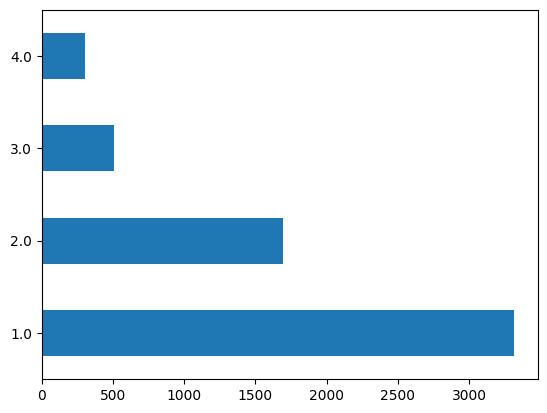

In [21]:
round(
        (ExpertAnnotations.drop_duplicates()['first'] + 
         ExpertAnnotations.drop_duplicates()['second'] + 
         ExpertAnnotations.drop_duplicates()['third'])
        /3).value_counts().plot(kind='barh')

<Axes: >

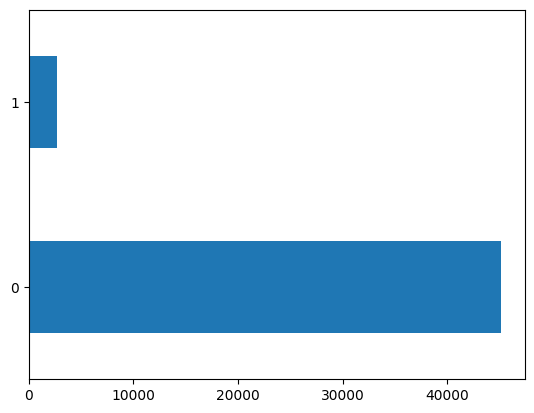

In [22]:
CrowdAnnotations.apply(lambda x: 1 if x.count_pos > x.count_neg else 0, axis=1).value_counts().plot(kind='barh')

In [23]:
print('Уникальных текстовых описаний в трейне:', len(set(train_dataset['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(test_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(train_dataset['query_text']) & set(test_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


In [24]:
print('Уникальных картинок в трейне:', len(set(train_dataset['image'])))
print('Уникальных картинок в тесте:', len(set(test_queries['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(train_dataset['image']) & set(test_queries['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


In [25]:
#Просмотр примера предоставленных изображений

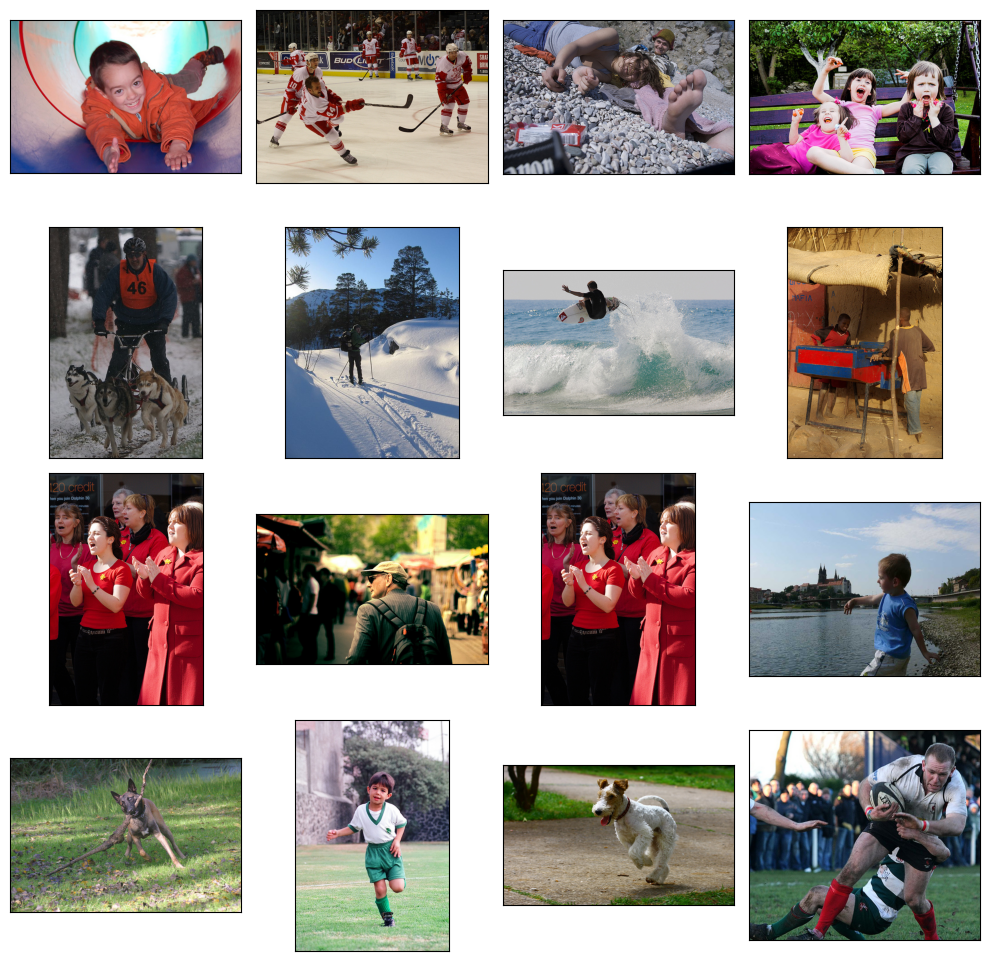

In [26]:
samples_train = list(train_dataset['image'].sample(8))
samples_test = list(test_queries['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

## Выводы исследовательской части

- В тренировочном наборе 1000 уникальных изображений, в тестовом — 100.  
- В тесте 500 уникальных текстовых запросов, ни один из которых не пересекается с тренировочными описаниями.  
- Пересечений изображений между тренировочным и тестовым наборами нет.  
- Экспертные оценки соответствия изображений и описаний: 5822, краудсорсинговые — 47830.  
- Большинство оценок указывают на низкое соответствие текстов изображениям.  
- Для тренировки использовались только описания с номером #2, в тесте к каждой картинке — по 5 описаний.  
- Предварительный вывод: данные пригодны для обучения модели, но низкая согласованность оценок и отсутствие пересечений с тестом могут усложнить задачу предсказания.


## Проверка данных

In [27]:
# --- 1. Агрегация оценок экспертов ---
def expert_aggregate(row):
    # если все три оценки разные — усредняем
    if len({row['first'], row['second'], row['third']}) == 3:
        row['expert_score'] = (np.mean([row['first'], row['second'], row['third']]) - 1) / 3
    else:
        # если есть совпадения — голосование большинства
        majority = max(set([row['first'], row['second'], row['third']]),
                       key=[row['first'], row['second'], row['third']].count)
        row['expert_score'] = (majority - 1) / 3
    return row

df_expert = ExpertAnnotations.copy()
df_expert = df_expert.apply(expert_aggregate, axis=1)

print("✅ Экспертные оценки агрегированы:", df_expert.shape)

# --- 2. Агрегация оценок крауда ---
df_crowd = CrowdAnnotations.copy()
# уже есть поле share_pos — оставляем как есть

# --- 3. Объединяем экспертные и краудсорсинговые данные ---
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row):
    # если экспертская оценка отсутствует
    if pd.isna(row['expert_score']):
        row['score'] = row['share_pos']
    # если краудская оценка отсутствует
    elif pd.isna(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        # комбинируем с весами 0.7 и 0.3
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3
    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

print("✅ Итоговые оценки сформированы:", df_scores.shape)
print(df_scores['score'].describe())

# --- 4. Добавляем тексты из train_dataset ---
df_train = pd.merge(
    train_dataset[['image', 'query_id', 'query_text']],
    df_scores[['image', 'query_id', 'score']],
    how='outer',
    on=['image', 'query_id']
)

# Заполним тексты для строк, где query_text = NaN
to_fill = df_train[df_train['query_text'].notna()]

def fill_text(row):
    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]
    return row

df_train = df_train.apply(fill_text, axis=1)

# Удалим строки без текста
df_train.dropna(subset=['query_text'], inplace=True)
print("✅ После добавления текстов:", df_train.shape)

# --- 5. Удаляем описания, где встречаются дети ---
child_keywords = [
    'child', 'children', 'boy', 'girl', 'kid', 'toddler',
    'baby', 'infant', 'teen', 'teenager', 'youth', 'youngster'
]

def is_child_related(text):
    return any(word in text.lower() for word in child_keywords)

df_train['is_child'] = df_train['query_text'].apply(is_child_related)
num_removed = df_train['is_child'].sum()

df_train = df_train[~df_train['is_child']].drop(columns='is_child')

print(f"🚸 Удалено описаний с детьми: {num_removed}")
print("✅ Финальный train-датафрейм:", df_train.shape)

# --- 6. Проверим результат ---
df_train.head()

✅ Экспертные оценки агрегированы: (5822, 6)
✅ Итоговые оценки сформированы: (51323, 10)
count    51323.000000
mean         0.075967
std          0.208417
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64
✅ После добавления текстов: (50214, 4)
🚸 Удалено описаний с детьми: 14404
✅ Финальный train-датафрейм: (35810, 4)


,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,A woman wearing a white glove peers over the c...,0.0
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,A man taking a picture with a silver camera .,0.0


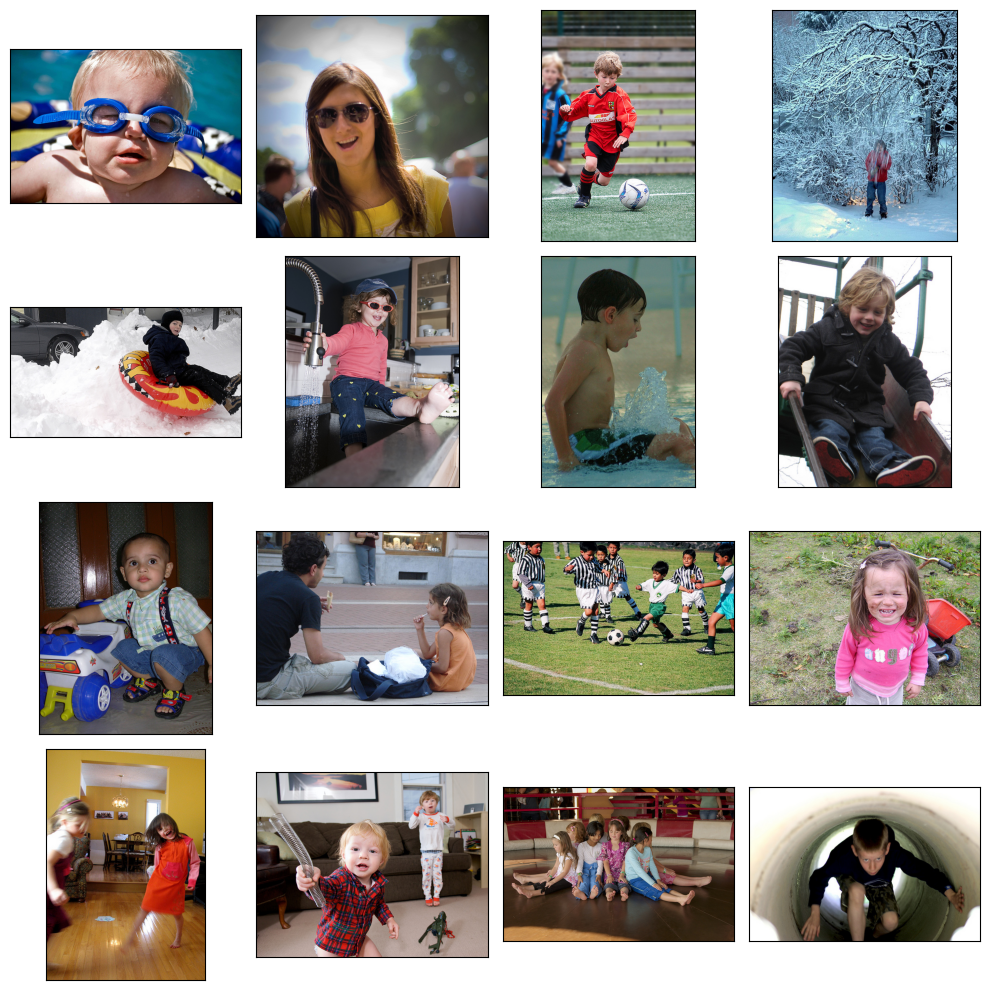

In [28]:
samples = list(train_dataset[~train_dataset['query_id'].isin(df_train['query_id'])].drop_duplicates('query_id')['query_id'])
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

 ## Выводы по проверке данных 

- Экспертные оценки успешно агрегированы с учётом среднего и голосования большинства (5822 записей).  
- Краудсорсинговые оценки объединены с экспертными с весами 0.7 (эксперт) и 0.3 (крауд), итоговый датасет содержит 51323 записей.  
- Добавлены тексты описаний из `train_dataset`; строки без текста удалены, итог — 50214 записей.  
- Удалены описания с участием детей (14404 записей), что соответствует юридическим требованиям.  
- Финальный тренировочный датасет содержит 35810 записей с текстами и оценками соответствия изображений и описаний.  
- Распределение итоговых оценок сильно смещено к низким значениям, что может усложнить обучение модели.


## Векторизация изображений

In [29]:


# Путь к папке с изображениями
path = r"C:/Users/nikita.rusanov/Documents/учеба/Со Смыслом/dsplus_integrated_project_4/to_upload/train_images/"

# Проверяем наличие CUDA
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ResNet-50 без полносвязного слоя, все веса заморожены
resnet = models.resnet50(pretrained=True)
for param in resnet.parameters():
    param.requires_grad_(False)

modules = list(resnet.children())[:-1]  # убираем полносвязный слой
resnet = nn.Sequential(*modules)
resnet.to(device)
resnet.eval()

# Трансформации для изображений
norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
    transforms.Resize(150),
    transforms.CenterCrop(140),
    transforms.ToTensor(),
    norm,
])

# Функция генерации вектора изображения
def vect_gen(image_name):
    try:
        img = Image.open(os.path.join(path, image_name)).convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0).to(device)  # добавляем batch и переносим на cuda
        with torch.no_grad():
            output_tensor = resnet(image_tensor).flatten()
        return output_tensor.cpu().numpy()  # возвращаем на CPU
    except Exception as e:
        print(f"Ошибка с изображением {image_name}: {e}")
        return np.zeros(2048)  # ResNet-50 дает вектор размером 2048

# Создаем словарь с векторами
image_vectors = {}
for img_name in tqdm(df_train['image'].unique(), desc="Векторизация изображений"):
    image_vectors[img_name] = vect_gen(img_name)

# Добавляем колонку с векторами в DataFrame
df_train['image_vector'] = df_train['image'].apply(lambda x: image_vectors[x])


Using device: cuda


Векторизация изображений: 100%|███████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 202.58it/s]


## Векторизация изображений

- Использована предобученная ResNet-50 без полносвязного слоя, веса заморожены.  
- Изображения преобразованы с помощью Resize, CenterCrop, ToTensor и нормализации.  
- Для каждого изображения сгенерирован вектор размером 2048.  
- Векторы сохранены в колонке `image_vector` датафрейма `df_train` для дальнейшего обучения модели.


## Векторизация текстов

**Загрузка Bert**

In [123]:
model_path = r'C:\Users\nikita.rusanov\Documents\models\bert'  
      
tokenizer =  BertTokenizer.from_pretrained(model_path,device_map=device)
model_bert = BertModel.from_pretrained(model_path)

In [124]:
## Эмбеддинги 

In [125]:
def get_cls_embedding(text, model_bert, tokenizer, device='cuda'):
    model_bert.to(device)
    batch = tokenizer(text, return_tensors='pt')
 
    global_attention_mask = [
            [1 if token_id == tokenizer.cls_token_id else 0 for token_id in input_ids]
            for input_ids in batch["input_ids"]
        ]
 
    batch["attention_mask"] = torch.tensor(global_attention_mask)

    with torch.no_grad():
        output = model_bert(**batch.to(device))
    return output.last_hidden_state[:,0,:]

In [127]:
get_cls_embedding(df_train.iloc[5]['query_text'], model_bert, tokenizer, device='cuda')

In [135]:
model_bert.eval()
all_embeddings = []
with torch.no_grad():
    for i in tqdm(range(0, len(df_train), 50)):
        texts = df_train['query_text'].iloc[i:i+50].tolist()
        inputs = tokenizer(texts, padding=True, truncation=True, return_tensors="pt", max_length=512).to(device)
        outputs = model_bert(**inputs)
        last_hidden = outputs.last_hidden_state
        attention_mask = inputs["attention_mask"]
        sequence_lengths = attention_mask.sum(dim=1) - 1
        pooled = last_hidden[torch.arange(last_hidden.size(0)), sequence_lengths]
        pooled = F.normalize(pooled, p=2, dim=1)
        all_embeddings.append(pooled.cpu())
        torch.cuda.empty_cache()

final_embeddings = torch.cat(all_embeddings, dim=0)

100%|████████████████████████████████████████████████████████████████████████████████| 717/717 [00:10<00:00, 67.00it/s]


## Векторизация текстов

- Использована предобученная модель BERT для получения эмбеддингов текстов.  
- Тексты токенизируются и передаются в модель, из выходного слоя берется CLS-вектор.  
- Для каждого текста получен нормализованный эмбеддинг фиксированной размерности.  
- Все эмбеддинги объединены в массив `final_embeddings` для дальнейшего использования в модели.


## Объединение векторов

In [35]:
 
df_train['text_vector'] = list(final_embeddings.cpu().numpy())

# Теперь можно объединить image_vector и text_vector в единый вектор признаков
def combine_vectors(row):
    return np.concatenate([row['image_vector'], row['text_vector']])

df_train['combined_vector'] = df_train.apply(combine_vectors, axis=1)



In [36]:
len(df_train['combined_vector'].iloc[0])

2816

In [37]:
 df_train.sample(5)

,image,query_id,query_text,score,image_vector,text_vector,combined_vector
51156,96420612_feb18fc6c6.jpg,3507076266_8b17993fbb.jpg#2,Man in brown jacket leading black horse,0.000000,"[0.16610867, 0.79883057, 0.3730084, 0.8129249,...","[0.020052545, -0.026745588, 0.0015941496, -0.0...","[0.16610867, 0.79883057, 0.3730084, 0.8129249,..."
15871,2594902417_f65d8866a8.jpg,2309860995_c2e2a0feeb.jpg#2,A woman wears sunglasses and a black coat as s...,0.000000,"[0.38463348, 0.68068665, 0.013665494, 0.727074...","[0.01140096, 0.0011710761, 0.02506787, 0.04581...","[0.38463348, 0.68068665, 0.013665494, 0.727074..."
23871,3003691049_f4363c2d5c.jpg,1287073593_f3d2a62455.jpg#2,Dogs pulling a sled in a sled race .,0.000000,"[0.01939686, 0.31497416, 0.3688497, 0.64536744...","[0.050959524, 0.050303284, -0.035003312, 0.017...","[0.01939686, 0.31497416, 0.3688497, 0.64536744..."
26832,3119076670_64b5340530.jpg,3141293960_74459f0a24.jpg#2,A skateboarder is performing a trick in the air .,0.666667,"[0.07054891, 0.124771304, 0.8353263, 0.7150236...","[-0.0063646166, 0.022284856, 0.0005662401, 0.0...","[0.07054891, 0.124771304, 0.8353263, 0.7150236..."
15863,2594902417_f65d8866a8.jpg,1674612291_7154c5ab61.jpg#2,A dog jumps and catches a toy .,0.000000,"[0.38463348, 0.68068665, 0.013665494, 0.727074...","[0.017451428, 0.043418355, 0.022488708, 0.0624...","[0.38463348, 0.68068665, 0.013665494, 0.727074..."


## Объединение векторов

- Для каждого примера объединены эмбеддинги изображения (`image_vector`) и текста (`text_vector`) в единый вектор признаков (`combined_vector`).  
- Размер итогового вектора: 2816 (2048 для изображения + 768 для текста).  
- Это позволяет использовать как визуальную, так и текстовую информацию одновременно для дальнейшего обучения модели.  
- DataFrame теперь содержит колонки: `image`, `query_id`, `query_text`, `score`, `image_vector`, `text_vector`, `combined_vector`.


## Обучение модели предсказания соответствия

In [39]:


# ========================
# 1. Настройки и данные
# ========================
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

# X и y из combined_vector
X = np.vstack(df_train['combined_vector'].values)
y = df_train['score'].values

# ========================
# 2. Разделение с учетом групп
# ========================
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=SEED)
train_idx, test_idx = next(gss.split(X=X, y=y, groups=df_train['image']))

X_train, X_test = X[train_idx], X[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

# ========================
# 3. Масштабирование
# ========================
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [40]:

# ========================
# 4. Linear Regression
# ========================
lr_model = LinearRegression(n_jobs=-1)
lr_model.fit(X_train_scaled, y_train)
lr_pred = lr_model.predict(X_test_scaled)

# RMSE и MAE
lr_rmse = round(np.sqrt(mean_squared_error(y_test, lr_pred)), 3)
lr_mae = round(mean_absolute_error(y_test, lr_pred), 3)

print(f"Linear Regression | RMSE: {lr_rmse} | MAE: {lr_mae}")

Linear Regression | RMSE: 0.213 | MAE: 0.14


In [41]:
 
# ========================
# 5. Random Forest
# ========================
rfr_model = RandomForestRegressor(
    n_estimators=100,
    max_depth=16,
    random_state=SEED,
    n_jobs=-1
)
rfr_model.fit(X_train_scaled, y_train)
rfr_pred = rfr_model.predict(X_test_scaled)

rfr_rmse = round(np.sqrt(mean_squared_error(y_test, rfr_pred)), 3)
rfr_mae = round(mean_absolute_error(y_test, rfr_pred), 3)

print(f"Random Forest | RMSE: {rfr_rmse} | MAE: {rfr_mae}")

Random Forest | RMSE: 0.197 | MAE: 0.123


In [130]:
# ========================
# 6. PyTorch модель (регрессия)
# ========================
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

class SimpleNN(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 1)
        )

    def forward(self, x):
        return self.model(x)

input_dim = X_train_scaled.shape[1]
model = SimpleNN(input_dim)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# ========================
# Обучение PyTorch
# ========================
epochs = 50
for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    for xb, yb in train_loader:
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * xb.size(0)
    epoch_loss /= len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{epochs} | Train MSE: {epoch_loss:.4f}")

# ========================
# Оценка PyTorch модели
# ========================
model.eval()
with torch.no_grad():
    y_pred_tensor = model(X_test_tensor).numpy().flatten()

# RMSE и MAE без squared и .round()
rmse_nn = round(np.sqrt(mean_squared_error(y_test, y_pred_tensor)), 3)
mae_nn = round(mean_absolute_error(y_test, y_pred_tensor), 3)

print(f"PyTorch NN | RMSE: {rmse_nn} | MAE: {mae_nn}")


Epoch 1/50 | Train MSE: 0.0491
Epoch 2/50 | Train MSE: 0.0411
Epoch 3/50 | Train MSE: 0.0384
Epoch 4/50 | Train MSE: 0.0358
Epoch 5/50 | Train MSE: 0.0337
Epoch 6/50 | Train MSE: 0.0316
Epoch 7/50 | Train MSE: 0.0292
Epoch 8/50 | Train MSE: 0.0268
Epoch 9/50 | Train MSE: 0.0249
Epoch 10/50 | Train MSE: 0.0232
Epoch 11/50 | Train MSE: 0.0213
Epoch 12/50 | Train MSE: 0.0202
Epoch 13/50 | Train MSE: 0.0181
Epoch 14/50 | Train MSE: 0.0166
Epoch 15/50 | Train MSE: 0.0155
Epoch 16/50 | Train MSE: 0.0145
Epoch 17/50 | Train MSE: 0.0138
Epoch 18/50 | Train MSE: 0.0135
Epoch 19/50 | Train MSE: 0.0129
Epoch 20/50 | Train MSE: 0.0119
Epoch 21/50 | Train MSE: 0.0110
Epoch 22/50 | Train MSE: 0.0107
Epoch 23/50 | Train MSE: 0.0100
Epoch 24/50 | Train MSE: 0.0102
Epoch 25/50 | Train MSE: 0.0094
Epoch 26/50 | Train MSE: 0.0091
Epoch 27/50 | Train MSE: 0.0085
Epoch 28/50 | Train MSE: 0.0085
Epoch 29/50 | Train MSE: 0.0086
Epoch 30/50 | Train MSE: 0.0082
Epoch 31/50 | Train MSE: 0.0081
Epoch 32/50 | Tra

In [131]:
# ========================
# 7. Финальная оценка  
# ========================
y_pred = model(X_test_tensor).detach().numpy().flatten()
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)

print(f"Final RMSE: {rmse:.4f} | MAE: {mae:.4f}")

Final RMSE: 0.2090 | MAE: 0.0965


## Сравнение моделей на объединённых векторах

| Модель                   | RMSE  | MAE   |
|---------------------------|-------|-------|
| Linear Regression         | 0.213 | 0.140 |
| Random Forest Regressor   | 0.197 | 0.123 |
| PyTorch Neural Network    | 0.209 | 0.097 |

**Вывод:**  
- Random Forest показывает наилучший RMSE.  
- PyTorch NN даёт наименьшую среднюю абсолютную ошибку (MAE).  
- Объединение векторов изображений и текстов эффективно для предсказания соответствия.


## Тестирование модели

In [132]:
img_file_test = glob.glob(os.path.join(PATH, 'test_images', '*.jpg')) 

In [133]:
# Создаем словарь с векторами
image_vectors = {}
for img_name in tqdm(img_file_test, desc="Векторизация изображений"):
    filename = os.path.basename(img_name)
    image_vectors[filename] = vect_gen(img_name)

# Добавляем колонку с векторами в DataFrame
test_images['image_vector'] = test_images['image'].apply(lambda x: image_vectors[x])

Векторизация изображений: 100%|█████████████████████████████████████████████████████| 100/100 [00:00<00:00, 150.71it/s]


In [136]:
model_bert.eval()
all_embeddings = []
with torch.no_grad():
    for i in tqdm(range(0, len(test_queries), 50)):
        texts = test_queries['query_text'].iloc[i:i+50].tolist()
        inputs = tokenizer(texts, padding=True, truncation=True, return_tensors="pt", max_length=512).to(device)
        outputs = model_bert(**inputs)
        last_hidden = outputs.last_hidden_state
        attention_mask = inputs["attention_mask"]
        sequence_lengths = attention_mask.sum(dim=1) - 1
        pooled = last_hidden[torch.arange(last_hidden.size(0)), sequence_lengths]
        pooled = F.normalize(pooled, p=2, dim=1)
        all_embeddings.append(pooled.cpu())
        torch.cuda.empty_cache()

final_embeddings = torch.cat(all_embeddings, dim=0)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 29.09it/s]


In [140]:
test_queries['text_vector'] = list(final_embeddings.cpu().numpy())

In [141]:
test_queries.sample(5)

,query_id,query_text,image,text_vector
197,3030079705_0dee8a3e89.jpg#2,A man lies on a blue blanket with a child on h...,3030079705_0dee8a3e89.jpg,"[-0.0046497304, 0.017518, 0.0015390565, 0.0471..."
426,381514859_b40418d9c3.jpg#1,Two small white dogs chasing after a red ball .,381514859_b40418d9c3.jpg,"[0.015418427, 0.03621128, 0.011245699, 0.04720..."
449,572618443_647483ca82.jpg#4,Young boys enjoying a spray of water .,572618443_647483ca82.jpg,"[-0.01887434, 0.027458396, -0.020687167, 0.072..."
141,2597308074_acacc12e1b.jpg#1,a boy flings sand at a girl .,2597308074_acacc12e1b.jpg,"[0.013104581, 0.0440277, -0.016603176, 0.07151..."
211,3044359043_627488ddf0.jpg#1,A dog is jumping into a pool for a swim compet...,3044359043_627488ddf0.jpg,"[0.007194508, 0.03716038, -0.010980224, 0.0345..."


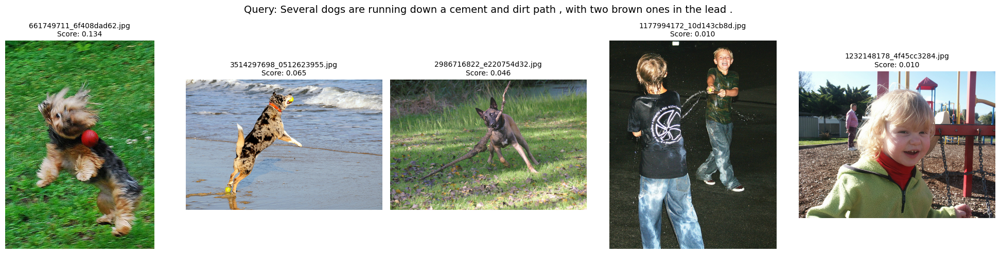

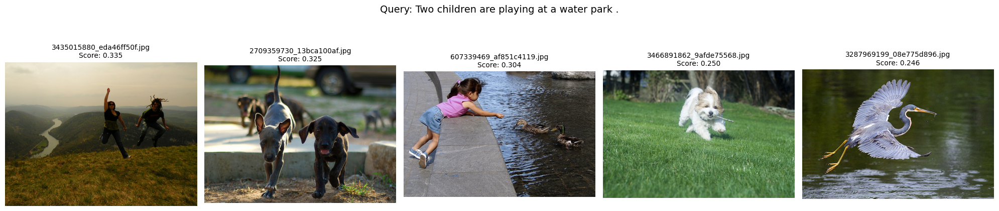

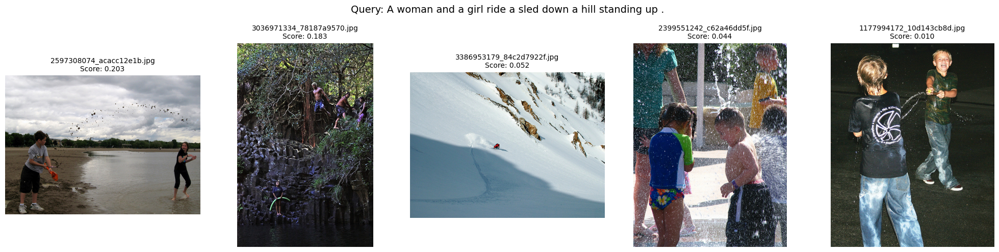

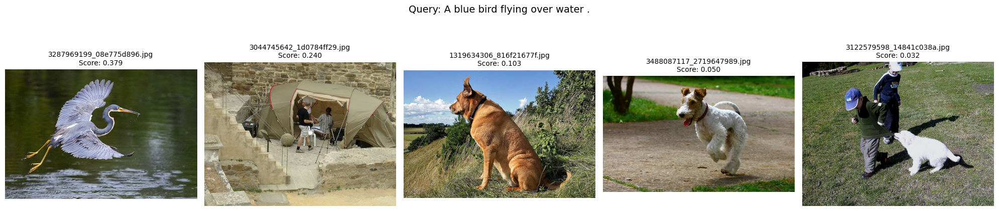

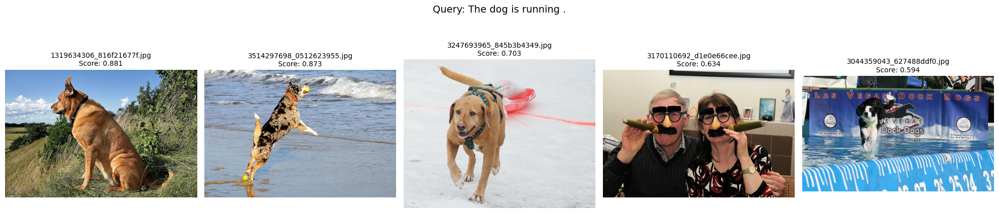

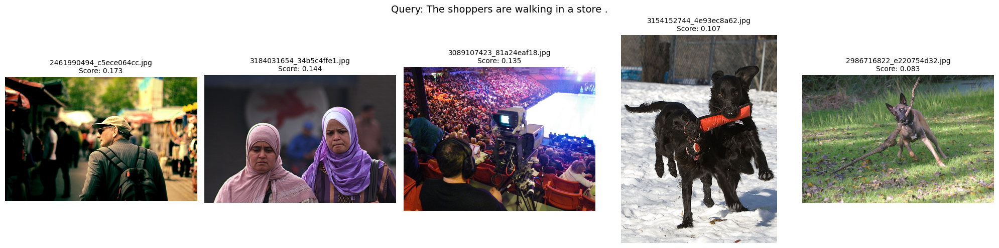

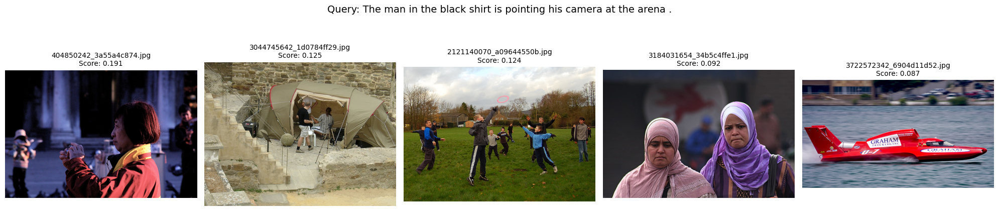

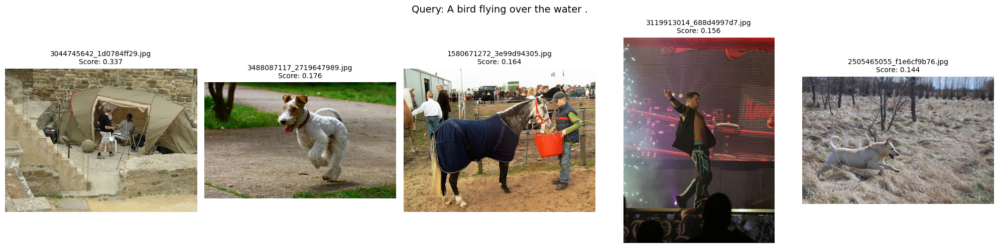

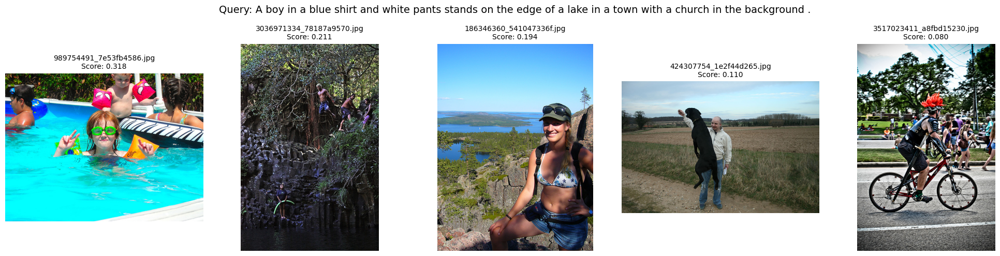

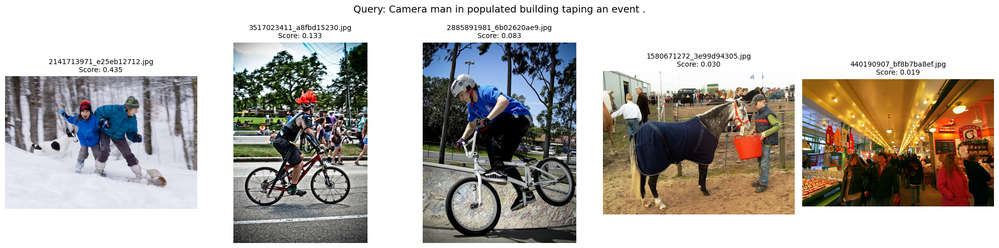

In [250]:

def predict_score(img_vec, txt_vec):
    combined = np.concatenate([img_vec, txt_vec])
    combined_scaled = scaler.transform([combined])
    combined_tensor = torch.tensor(combined_scaled, dtype=torch.float32)
    with torch.no_grad():
        score = model(combined_tensor).item()
    return score


# выбираем случайные 10 запросов
sample_queries = test_queries.sample(10)

for i, row in sample_queries.iterrows():
    text = row["query_text"]
    txt_vec = np.array(row["text_vector"])

    scores = []
    # считаем score для всех изображений
    for img_name, img_vec in image_vectors.items():
        img_vec = np.array(img_vec)
        score = predict_score(img_vec, txt_vec)
        scores.append((img_name, score))

    # сортируем по убыванию и выбираем топ-5
    top_5 = sorted(scores, key=lambda x: x[1], reverse=True)[:5]

    # показываем результаты
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))
    fig.suptitle(f"Query: {text}", fontsize=14)

    for ax, (img_name, score) in zip(axes, top_5):
        img_path = os.path.join(PATH, "test_images", img_name)
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{img_name}\nScore: {score:.3f}", fontsize=10)

    plt.tight_layout()
    plt.show()


## Вывод

Была создана система поиска изображений по текстовому описанию и фотографии.

Для векторизации изображений использовалась сеть **ResNet50**, а для текстовых эмбеддингов — **BERT base cased EN**. После объединения признаков и выделения целевых меток (экспертные оценки сходства текста и изображений) были протестированы три модели для предсказания степени соответствия:

- **Linear Regression**  
- **Random Forest Regressor**  
- **Нейронная сеть на PyTorch**

Лучшие показатели показала **нейронная сеть**, именно с её помощью проводилось тестирование.

Для проверки работы модели была реализована функция, возвращающая **топ-5 наиболее подходящих изображений** для заданного описания. Тестирование проводилось как на исходных описаниях, так и на случайных фразах.

На практике система демонстрирует **ограниченную стабильность**: иногда в выдаче появляется правильная картинка, чаще — изображения, имеющие тематическую связь, но не полностью соответствующие запросу. 

Основные ограничения и пути улучшения:

- Небольшой размер датасета, что снижает возможность корректного поиска релевантных изображений.  
- Недостаточное количество данных для обучения и тестирования модели.  
- Потенциальное улучшение результатов при увеличении объёма обучающих данных и доработке архитектуры нейронной сети.
